# Hierarchical Exponential Smoothing Model

In this blog post, we experiment with a hierarchical exponential smoothing forecasting model, extending the ideas from the univariate case presented in the blog post ["Notes on Exponential Smoothing with NumPyro"](https://juanitorduz.github.io/exponential_smoothing_numpyro/). We use [NumPyro](https://github.com/pyro-ppl/numpyro) and compare the NUTS and SVI results. For such a purpose, we use **Continuous Ranked Probability Score** ([CRPS](https://towardsdatascience.com/crps-a-scoring-function-for-bayesian-machine-learning-models-dd55a7a337a8)). We also compare these forecasts with univariate statistical models like Holt-Winters, AutoETS and Seasonal Naive from the great [Statsforecast](https://nixtlaverse.nixtla.io/statsforecast/index.html) package. These baseline models are, in general, hard to beat!

A (partial) motivation for this experiment is the recently released package [Prophetverse](https://github.com/felipeangelimvieira/prophetverse), which extends the model ideas from [Prophet](https://facebook.github.io/prophet/) to hierarchical models (also in NumPyro) and with custom likelihoods. Even though Prophet does not perform as expected in many real applications (see, for example [here](https://sarem-seitz.com/posts/facebook-prophet-covid-and-why-i-dont-trust-the-prophet/) among others), the Bayesian approach of the Prophetverse package is certainly very interesting.

On this occasion, we do not do a proper model benchmark against Prophetverse; we do use one of the data sets provided in the documentation: the [*tourism dataset*](https://felipeangelimvieira.github.io/prophetverse/examples/hierarchical/). The main difference with the example provided in the documentation is that we use a different level of aggregation so that we get more time series to test with ($308$ vs $5$). We are particularly interested in seeing how well it scales.

**Experiment Takeaways**

Here is a concise summary of the findings from this experiment:

- NumPyro is a great and flexible framework for developing custom time series models at scale. Extending the univariate case to the multivariate hierarchical one is relatively straightforward. One has to pay particular attention to the tensor dimensions (see [Tensor shapes in Pyro](https://pyro.ai/examples/tensor_shapes.html)).

- Hierarchical models are great for pooling information across time series. For this particular example, we see a benefit in having a hierarchy on the trend component.
  
- Stochastic variational inference (SVI) is an excellent inference approach for models with a lot of data. In this concrete example, SVI performs comparably to NUTS (as a point estimate and probabilistic model via CRPS).

- We can use this hierarchical model as a baseline to develop more complex and custom models.

- Statistical models like [AutoETS](https://nixtlaverse.nixtla.io/statsforecast/docs/models/autoets.html) are challenging to beat. Our hierarchical model is marginally better than this model. It might not always pay off NumPyro maintenance if there is no real benefit from a custom component (for example, a custom likelihood as described in the blog post ["Bayesian Censoring Data Modeling"](https://juanitorduz.github.io/censoring/))

## Prepare Notebook

In [1]:
from collections.abc import Callable
from datetime import UTC, datetime

import arviz as az
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
import numpyro
import numpyro.distributions as dist
import polars as pl
import seaborn as sns
from jax import Array, random
from numpyro.contrib.control_flow import scan
from numpyro.infer import MCMC, NUTS, SVI, Predictive, Trace_ELBO
from numpyro.infer.autoguide import AutoDiagonalNormal
from numpyro.infer.initialization import init_to_sample
from pydantic import BaseModel, Field
from sklearn.preprocessing import LabelEncoder
from statsforecast import StatsForecast
from statsforecast.models import AutoETS, HoltWinters, SeasonalNaive

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"

numpyro.set_host_device_count(n=4)

rng_key = random.PRNGKey(seed=42)

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

## Read in Data

We read the data from the Prophetverse repository:

In [2]:
data_path = "https://raw.githubusercontent.com/felipeangelimvieira/prophetverse/main/src/prophetverse/datasets/raw/tourism.csv"

raw_data_df = pl.read_csv(data_path, try_parse_dates=True)

data_df = raw_data_df.select(pl.all().name.to_lowercase())

data_df.head()

,quarter,region,state,purpose,trips
i64,date,str,str,str,f64
1,1998-01-01,"""Adelaide""","""South Australia""","""Business""",135.07769
2,1998-04-01,"""Adelaide""","""South Australia""","""Business""",109.987316
3,1998-07-01,"""Adelaide""","""South Australia""","""Business""",166.034687
4,1998-10-01,"""Adelaide""","""South Australia""","""Business""",127.160464
5,1999-01-01,"""Adelaide""","""South Australia""","""Business""",137.448533


## Exploratory Data Analysis

We do a basic exploratory data analysis to understand the data structure. We start by counting the number of regions per state:

In [3]:
data_df.group_by("state").agg(pl.col("region").n_unique().alias("n_regions"))

state,n_regions
str,u32
"""Victoria""",21
"""Northern Territory""",13
"""Western Australia""",5
"""New South Wales""",13
"""South Australia""",12
"""Queensland""",12
"""ACT""",1


We also make sure that regions are mapped to a unique state:

In [4]:
assert (
    data_df["region"].n_unique()
    == data_df.group_by("state")
    .agg(pl.col("region").n_unique().alias("n_regions"))["n_regions"]
    .sum()
)

Next, we look into the `purpose` feature:

In [5]:
data_df["purpose"].unique()

purpose
str
"""Holiday"""
"""Other"""
"""Business"""
"""Visiting"""


In this case, every region has the $4$ possible purposes split:

In [6]:
assert (
    data_df["purpose"].unique().shape[0]
    == data_df.group_by("region")
    .agg(pl.col("purpose").n_unique().alias("n_purposes"))["n_purposes"]
    .unique()
    .item()
)

For the purpose of this example, we will consider the time series generated by the `state` + `region` + `purpose` combination. Let's count the number of resulting time series:

In [7]:
data_df = data_df.with_columns(
    unique_id=pl.concat_str(
        [pl.col("state"), pl.col("region"), pl.col("purpose")], separator="::"
    )
)

data_df["unique_id"].n_unique()

308

We plot a sample of the time series:

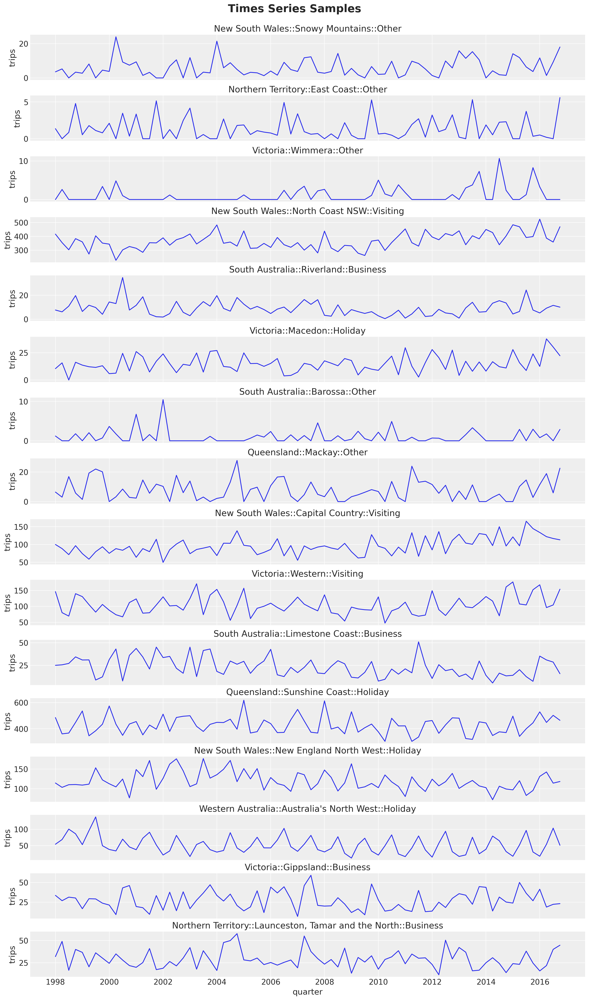

In [8]:
n_series = 16

unique_ids = data_df.select("unique_id").sample(
    n=n_series, with_replacement=False, seed=42
)

fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 25),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        data=data_df.filter(pl.col("unique_id") == unique_id),
        x="quarter",
        y="trips",
        ax=ax,
    )
    ax.set(title=unique_id)

fig.suptitle("Times Series Samples", fontsize=20, fontweight="bold", y=1.02);

Here are some observations about the time series structure:

- Most of the time series have a yearly seasonality. The pattern is clearer for some of these series than for others.

- The series look stationary overall (mean and variance do not change over time). We see a mild trend component in some of the series.

## Prepare Data

For this simple example we do a simple train-test split. For real applications it is **strongly** recommended to use a time series cross-validation strategy (see [
Evaluate the model’s performance](https://nixtlaverse.nixtla.io/statsforecast/docs/getting-started/getting_started_complete.html#evaluate-the-models-performance)).

In [9]:
train_test_split_date = datetime(year=2014, month=1, day=1, tzinfo=UTC)

train_data_df = data_df.filter(pl.col("quarter") < pl.lit(train_test_split_date))
test_data_df = data_df.filter(pl.col("quarter") >= pl.lit(train_test_split_date))

n_test = test_data_df["quarter"].n_unique()

assert train_data_df.shape[0] + test_data_df.shape[0] == data_df.shape[0]

In [10]:
pivot_data_train_df = train_data_df.pivot(
    index="quarter", columns="unique_id", values="trips"
)
pivot_data_test_df = test_data_df.pivot(
    index="quarter", columns="unique_id", values="trips"
)

/var/folders/cm/3dzy9rdd5s3672z0s1brjkvh0000gn/T/ipykernel_20519/3322433497.py:1: DeprecationWarning: the argument `columns` for `DataFrame.pivot` is deprecated. It was renamed to `on` in version 1.0.0.
  pivot_data_train_df = train_data_df.pivot(
/var/folders/cm/3dzy9rdd5s3672z0s1brjkvh0000gn/T/ipykernel_20519/3322433497.py:4: DeprecationWarning: the argument `columns` for `DataFrame.pivot` is deprecated. It was renamed to `on` in version 1.0.0.
  pivot_data_test_df = test_data_df.pivot(


We want to add a hierarchical structure to the model using the `state` feature. For this purpose, we need a mapping from each time series to a state.

In [11]:
# We can just use the columns from the training data as the mapping input
assert pivot_data_train_df.columns == pivot_data_test_df.columns

# We extract the state from the column names
ts_state_mapping = [col.split("::")[0] for col in pivot_data_train_df.columns[1:]]

# We use a LabelEncoder to encode the states
state_encoder = LabelEncoder()
state_encoder.fit(ts_state_mapping)

ts_state_mapping_idx = state_encoder.transform(ts_state_mapping)

# We will use `ts_state_mapping_idx` to map the columns to the states in a numeric way
assert state_encoder.classes_[ts_state_mapping_idx].tolist() == ts_state_mapping

In [12]:
y_train = pivot_data_train_df.drop("quarter").to_jax()
y_test = pivot_data_test_df.drop("quarter").to_jax()

In [13]:
train_unique_ids = pivot_data_train_df.drop("quarter").columns
test_unique_ids = pivot_data_test_df.drop("quarter").columns

train_dates = pivot_data_train_df["quarter"].dt.strftime("%Y-%m-%d").to_numpy()
test_dates = pivot_data_test_df["quarter"].dt.strftime("%Y-%m-%d").to_numpy()

## Statsforecast Model

We start by fitting some univariate models from the Statsforecast package.

In [14]:
n_seasons = 4

models = [
    AutoETS(season_length=n_seasons),
    HoltWinters(season_length=n_seasons),
    SeasonalNaive(season_length=n_seasons),
]

sf = StatsForecast(models=models, freq="1q")

sf_forecast = sf.forecast(
    h=n_test,
    df=train_data_df.select(["unique_id", "quarter", "trips"]),
    time_col="quarter",
    target_col="trips",
    level=[94, 50],
)

Let's look into the point forecasts on the test set:

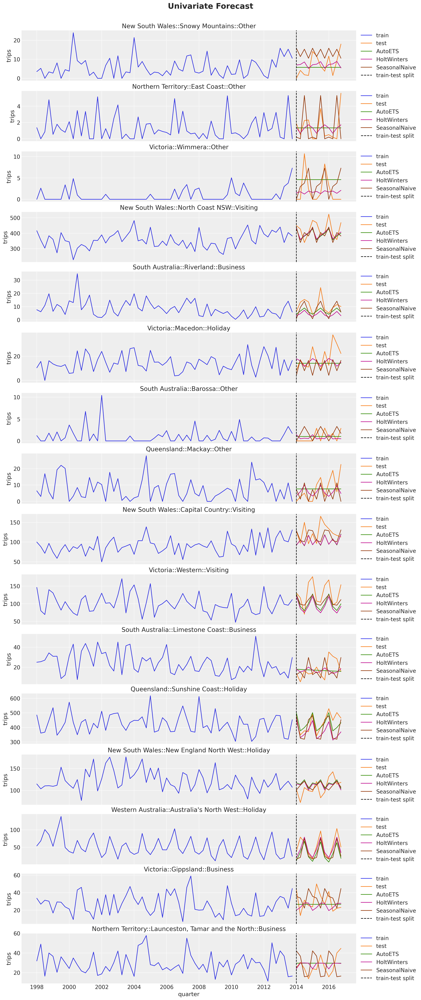

In [15]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 35),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )

    for j, model_name in enumerate(m.alias for m in models):
        temp_df = sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id))
        sns.lineplot(
            x=temp_df["quarter"],
            y=temp_df[f"{model_name}"],
            color=f"C{j + 2}",
            label=model_name,
            ax=ax,
        )

    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("Univariate Forecast", fontsize=20, fontweight="bold", y=1.02);

The AutoETS model is very conservative when the signal does not have a clear seasonal pattern. In many cases it predicts a straight line. The Seasonal Naive model is the most aggressive one, and the Holt-Winters model is in between.

We can now look into the prediction intervals of the Holt-Winters model. We are interested in this model as we will compare it with our hierarchical model version in NumPyro.

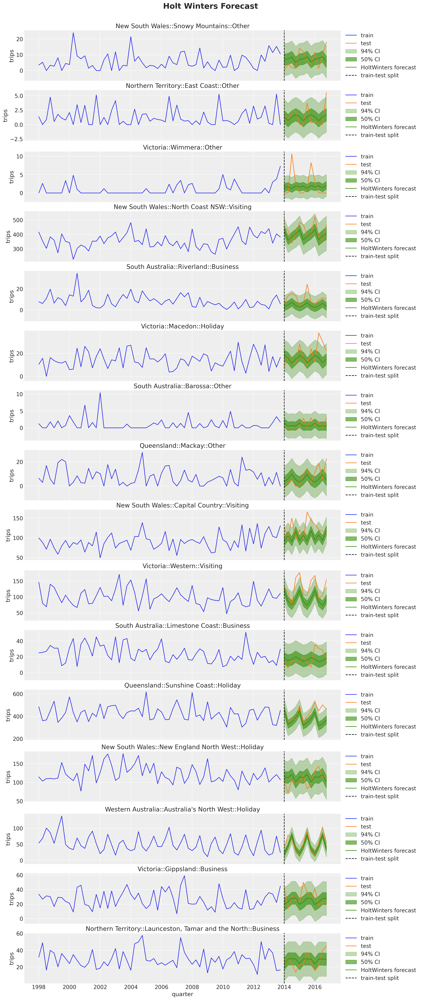

In [16]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 35),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )

    for j, level in enumerate([94, 50]):
        temp_df = sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id))
        ax.fill_between(
            temp_df["quarter"],
            temp_df[f"HoltWinters-lo-{level}"],
            temp_df[f"HoltWinters-hi-{level}"],
            alpha=0.3 * (j + 1),
            color="C2",
            label=f"{level}% CI",
        )

    sns.lineplot(
        data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
        x="quarter",
        y="HoltWinters",
        color="C2",
        label="HoltWinters forecast",
        ax=ax,
    )
    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("Holt Winters Forecast", fontsize=20, fontweight="bold", y=1.02);

## NumPyro Model

Now we implement the hierarchical model in NumPyro. In essence, we are extending the univariate model from the blog post ["Notes on Exponential Smoothing with NumPyro"](https://juanitorduz.github.io/exponential_smoothing_numpyro/). On top of the simple extension by vectorization via `plates`. We add a hierarchical component to the noise, trend component and seasonal components. For the hierarchical trend component, we use a middle layer so that each time series has its own trend component, but the trend components are pooled by state. The state trend components are then pooled by the global trend component.

In [17]:
def model(
    y: Array, ts_state_mapping_idx: Array, n_seasons: int, future: int = 0
) -> None:
    t_max, n_series = y.shape
    n_states = np.unique(ts_state_mapping_idx).size

    # Global trend smoothing

    trend_smoothing_concentration1_global_concentration = numpyro.sample(
        "trend_smoothing_concentration1_global_concentration",
        dist.Gamma(concentration=8, rate=4),
    )

    trend_smoothing_concentration1_global_rate = numpyro.sample(
        "trend_smoothing_concentration1_global_rate",
        dist.Gamma(concentration=8, rate=4),
    )

    trend_smoothing_concentration0_global_concentration = numpyro.sample(
        "trend_smoothing_concentration0_global_concentration",
        dist.Gamma(concentration=8, rate=4),
    )

    trend_smoothing_concentration0_global_rate = numpyro.sample(
        "trend_smoothing_concentration0_global_rate",
        dist.Gamma(concentration=8, rate=4),
    )

    # Global seasonality smoothing

    seasonality_smoothing_concentration1 = numpyro.sample(
        "seasonality_smoothing_concentration1",
        dist.Gamma(concentration=4, rate=2),
    )

    seasonality_smoothing_concentration0 = numpyro.sample(
        "seasonality_smoothing_concentration0",
        dist.Gamma(concentration=4, rate=2),
    )

    # Global noise scale

    noise_scale = numpyro.sample("noise_scale", dist.Gamma(concentration=80, rate=3))

    # States level trend smoothing
    with numpyro.plate("states", n_states, dim=-1):
        trend_smoothing_concentration1 = numpyro.sample(
            "trend_smoothing_concentration1",
            dist.Gamma(
                concentration=trend_smoothing_concentration1_global_concentration,
                rate=trend_smoothing_concentration1_global_rate,
            ),
        )

        trend_smoothing_concentration0 = numpyro.sample(
            "trend_smoothing_concentration0",
            dist.Gamma(
                concentration=trend_smoothing_concentration0_global_concentration,
                rate=trend_smoothing_concentration0_global_rate,
            ),
        )

    with numpyro.plate("series", n_series, dim=-1):
        # Level
        level_smoothing = numpyro.sample(
            "level_smoothing", dist.Beta(concentration1=1, concentration0=1)
        )

        level_init = numpyro.sample("level_init", dist.Normal(loc=0, scale=1))

        # Trend
        trend_smoothing = numpyro.sample(
            "trend_smoothing",
            dist.Beta(
                concentration1=trend_smoothing_concentration1[ts_state_mapping_idx],
                concentration0=trend_smoothing_concentration0[ts_state_mapping_idx],
            ),
        )

        trend_init = numpyro.sample("trend_init", dist.Normal(loc=0, scale=1))

        # Seasonality
        seasonality_smoothing = numpyro.sample(
            "seasonality_smoothing",
            dist.Beta(
                concentration1=seasonality_smoothing_concentration1,
                concentration0=seasonality_smoothing_concentration0,
            ),
        )
        adj_seasonality_smoothing = seasonality_smoothing * (1 - level_smoothing)

        with numpyro.plate("n_seasons", n_seasons, dim=-2):
            seasonality_init = numpyro.sample(
                "seasonality_init", dist.Normal(loc=0, scale=1)
            )

        ## Noise
        noise = numpyro.sample("noise", dist.HalfNormal(scale=noise_scale))

    def transition_fn(carry, t):
        previous_level, previous_trend, previous_seasonality = carry

        level = jnp.where(
            t < t_max,
            level_smoothing * (y[t] - previous_seasonality[0])
            + (1 - level_smoothing) * (previous_level + previous_trend),
            previous_level,
        )

        trend = jnp.where(
            t < t_max,
            trend_smoothing * (level - previous_level)
            + (1 - trend_smoothing) * previous_trend,
            previous_trend,
        )

        new_season = jnp.where(
            t < t_max,
            adj_seasonality_smoothing * (y[t] - (previous_level + previous_trend))
            + (1 - adj_seasonality_smoothing) * previous_seasonality[0],
            previous_seasonality[0],
        )

        step = jnp.where(t < t_max, 1, t - t_max + 1)

        mu = previous_level + step * previous_trend + previous_seasonality[0]

        pred = numpyro.sample("pred", dist.Normal(loc=mu, scale=noise).to_event(1))

        seasonality = jnp.concatenate(
            [previous_seasonality[1:], new_season[None]], axis=0
        )

        return (level, trend, seasonality), pred

    with numpyro.handlers.condition(data={"pred": y}):
        _, preds = scan(
            transition_fn,
            (level_init, trend_init, seasonality_init),
            jnp.arange(t_max + future),
        )

    if future > 0:
        numpyro.deterministic("y_forecast", preds[-future:, ...])

## NUTS Inference

The first inference approach we use is NUTS. We fit the model to the training data and make predictions on the test set. Fitting this model in my local machine (Mac M3) takes around $3$ minutes (not bad for a medium-size data set).

In [18]:
class InferenceParams(BaseModel):
    num_warmup: int = Field(1_500, ge=1)
    num_samples: int = Field(3_500, ge=1)
    num_chains: int = Field(4, ge=1)


def run_inference(
    rng_key: Array,
    model: Callable,
    args: InferenceParams,
    *model_args,
    **nuts_kwargs,
) -> MCMC:
    sampler = NUTS(model, **nuts_kwargs)
    mcmc = MCMC(
        sampler=sampler,
        num_warmup=args.num_warmup,
        num_samples=args.num_samples,
        num_chains=args.num_chains,
    )
    mcmc.run(rng_key, *model_args)
    return mcmc

In [19]:
inference_params = InferenceParams()

rng_key, rng_subkey = random.split(key=rng_key)
mcmc = run_inference(
    rng_subkey,
    model,
    inference_params,
    y_train,
    ts_state_mapping_idx,
    n_seasons,
    target_accept_prob=0.85,
)

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

We can look into some diagnostics.

In [20]:
idata = az.from_numpyro(
    posterior=mcmc,
    coords={
        "unique_id": train_unique_ids,
        "n_states": state_encoder.classes_,
        "n_seasons": np.arange(n_seasons),
    },
    dims={
        "level_init": ["unique_id"],
        "level_smoothing": ["unique_id"],
        "trend_init": ["unique_id"],
        "trend_smoothing_concentration0": ["n_states"],
        "trend_smoothing_concentration1": ["n_states"],
        "trend_smoothing": ["unique_id"],
        "seasonality_init": ["n_seasons", "unique_id"],
        "seasonality_smoothing": ["unique_id"],
        "noise": ["unique_id"],
    },
)

print(f"""Divergences: {idata["sample_stats"]["diverging"].sum().item()}""")

Divergences: 0


In [21]:
az.summary(
    data=idata,
    var_names=[
        "trend_smoothing_concentration1_global_concentration",
        "trend_smoothing_concentration1_global_rate",
        "trend_smoothing_concentration0_global_concentration",
        "trend_smoothing_concentration0_global_rate",
        "trend_smoothing_concentration1",
        "trend_smoothing_concentration0",
        "seasonality_smoothing_concentration1",
        "seasonality_smoothing_concentration0",
        "noise_scale",
    ],
    round_to=2,
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
trend_smoothing_concentration1_global_concentration,1.12,0.33,0.56,1.75,0.02,0.01,443.13,1353.68,1.01
trend_smoothing_concentration1_global_rate,2.96,0.85,1.43,4.55,0.01,0.01,7584.75,8846.67,1.00
trend_smoothing_concentration0_global_concentration,3.88,0.99,2.15,5.79,0.01,0.01,15510.60,9300.89,1.00
trend_smoothing_concentration0_global_rate,0.15,0.09,0.02,0.31,0.01,0.00,223.50,673.58,1.02
trend_smoothing_concentration1[ACT],0.30,0.29,0.01,0.81,0.01,0.01,1119.72,2227.93,1.01
trend_smoothing_concentration1[New South Wales],0.14,0.12,0.03,0.33,0.01,0.01,230.85,270.15,1.02
trend_smoothing_concentration1[Northern Territory],0.22,0.22,0.03,0.59,0.03,0.02,83.57,259.70,1.04
trend_smoothing_concentration1[Queensland],0.16,0.13,0.03,0.40,0.01,0.01,193.47,471.77,1.03
trend_smoothing_concentration1[South Australia],0.23,0.20,0.03,0.56,0.02,0.02,68.29,468.74,1.05
trend_smoothing_concentration1[Victoria],0.16,0.13,0.04,0.35,0.01,0.02,141.82,229.92,1.02


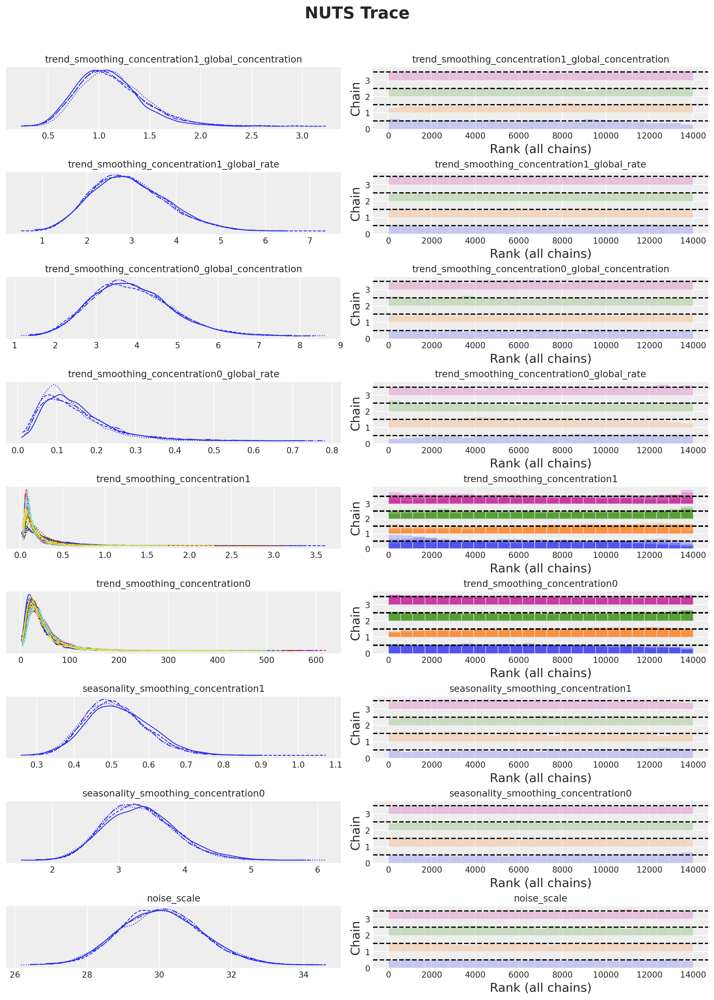

In [22]:
axes = az.plot_trace(
    data=idata,
    var_names=[
        "trend_smoothing_concentration1_global_concentration",
        "trend_smoothing_concentration1_global_rate",
        "trend_smoothing_concentration0_global_concentration",
        "trend_smoothing_concentration0_global_rate",
        "trend_smoothing_concentration1",
        "trend_smoothing_concentration0",
        "seasonality_smoothing_concentration1",
        "seasonality_smoothing_concentration0",
        "noise_scale",
    ],
    compact=True,
    kind="rank_bars",
    backend_kwargs={"figsize": (12, 16), "layout": "constrained"},
)
plt.gcf().suptitle("NUTS Trace", fontsize=20, fontweight="bold", y=1.05);

Overall, the model seems to have converged. Let's generate the sample forecasts.

In [23]:
def forecast(
    rng_key: Array, model: Callable, samples: dict[str, Array], *model_args
) -> dict[str, Array]:
    predictive = Predictive(
        model=model,
        posterior_samples=samples,
        return_sites=["y_forecast"],
    )
    return predictive(rng_key, *model_args)

In [24]:
rng_key, rng_subkey = random.split(key=rng_key)
forecast = forecast(
    rng_subkey,
    model,
    mcmc.get_samples(),
    y_train,
    ts_state_mapping_idx,
    n_seasons,
    n_test,
)

In [25]:
idata.extend(
    az.from_numpyro(
        posterior_predictive=forecast,
        coords={"unique_id": train_unique_ids, "date": test_dates},
        dims={"y_forecast": ["date", "unique_id"]},
    )
)

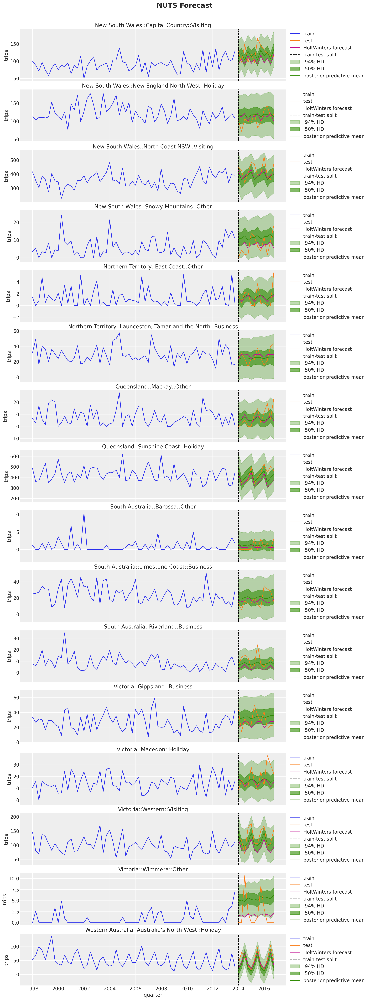

In [26]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 40),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"].sort()):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )
    sns.lineplot(
        data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
        x="quarter",
        y="HoltWinters",
        color="C3",
        label="HoltWinters forecast",
        ax=ax,
    )
    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    for j, hdi in enumerate([0.94, 0.5]):
        az.plot_hdi(
            x=pivot_data_test_df["quarter"],
            y=idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
            hdi_prob=hdi,
            smooth=False,
            color="C2",
            fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .0%} HDI"},
            ax=ax,
        )

    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=idata.posterior_predictive["y_forecast"]
        .sel(unique_id=unique_id)
        .mean(dim=("chain", "draw")),
        color="C2",
        label="posterior predictive mean",
        ax=ax,
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("NUTS Forecast", fontsize=20, fontweight="bold", y=1.02);

The results look very reasonable! A consequence of the hierarchical structure is that trend components are not soley determined byt the individual time series, but also by the group of time series. See for example:

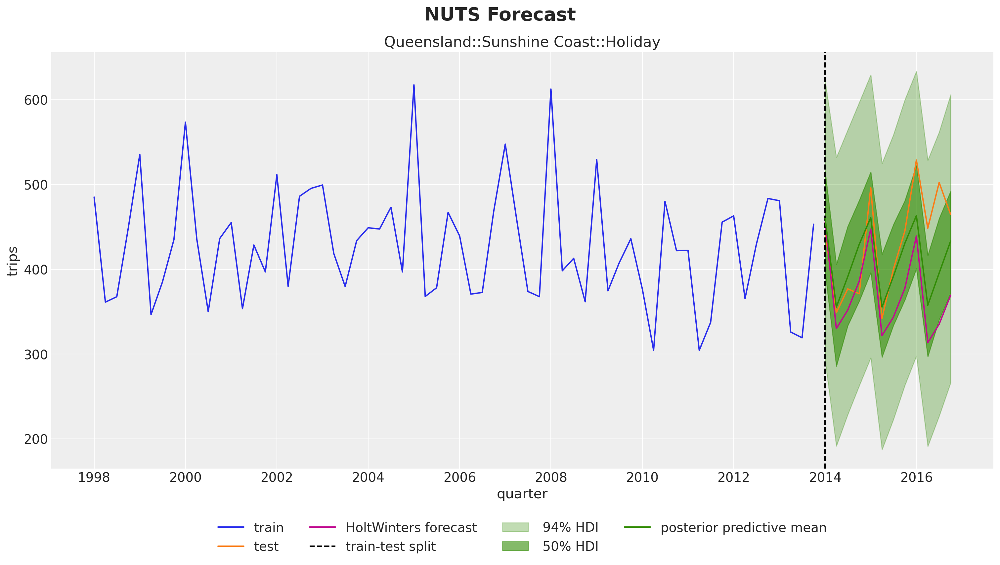

In [27]:
fig, ax = plt.subplots(figsize=(15, 8))


unique_id = "Queensland::Sunshine Coast::Holiday"

sns.lineplot(
    x=pivot_data_train_df["quarter"],
    y=pivot_data_train_df[unique_id],
    color="C0",
    label="train",
    ax=ax,
)
sns.lineplot(
    x=pivot_data_test_df["quarter"],
    y=pivot_data_test_df[unique_id],
    color="C1",
    label="test",
    ax=ax,
)
sns.lineplot(
    data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
    x="quarter",
    y="HoltWinters",
    color="C3",
    label="HoltWinters forecast",
    ax=ax,
)
ax.axvline(
    train_test_split_date,
    color="black",
    linestyle="--",
    label="train-test split",
)

for j, hdi in enumerate([0.94, 0.5]):
    az.plot_hdi(
        x=pivot_data_test_df["quarter"],
        y=idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
        hdi_prob=hdi,
        smooth=False,
        color="C2",
        fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .0%} HDI"},
        ax=ax,
    )

sns.lineplot(
    x=pivot_data_test_df["quarter"],
    y=idata.posterior_predictive["y_forecast"]
    .sel(unique_id=unique_id)
    .mean(dim=("chain", "draw")),
    color="C2",
    label="posterior predictive mean",
    ax=ax,
)

ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(title=unique_id, ylabel="trips")

fig.suptitle("NUTS Forecast", fontsize=20, fontweight="bold", y=1.05);

We will do a more formal evaluation of the model using the CRPS metric at the end of this blog post.

## Stochastic Variational Inference (SVI)

Next, we use SVI to fit the model. We use an [`AutoDiagonalNormal`](https://docs.pyro.ai/en/stable/infer.autoguide.html#autodiagonalnormal) guide to keep the inference simple. The fitting time is much faster than NUTS (around $15$ seconds in my local machine). For an introduction to SVI for time series models, see the blog posts ["Exploring TensorFlow Probability STS Forecasting"](https://juanitorduz.github.io/intro_sts_tfp/) and ["Finally! Bayesian Hierarchical Modelling at Scale"](https://florianwilhelm.info/2020/10/bayesian_hierarchical_modelling_at_scale/).

100%|██████████| 15000/15000 [00:11<00:00, 1273.52it/s, init loss: 7214161.0000, avg. loss [14251-15000]: 80222.7344]


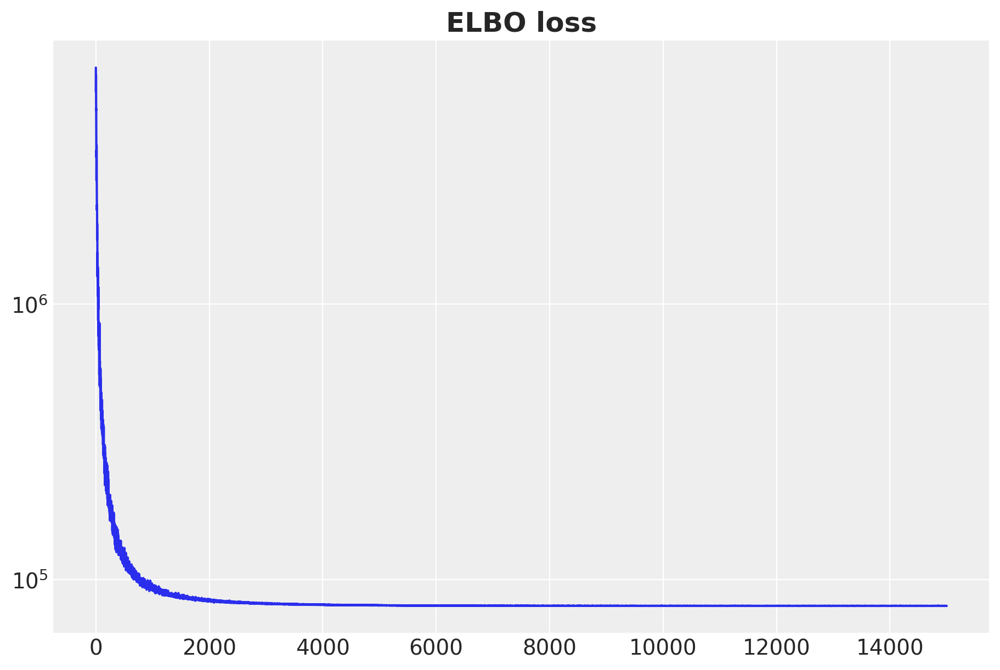

In [28]:
guide = AutoDiagonalNormal(model=model, init_loc_fn=init_to_sample)
optimizer = numpyro.optim.Adam(step_size=0.03)
svi = SVI(model, guide, optimizer, loss=Trace_ELBO())
num_steps = 15_000
rng_key, rng_subkey = random.split(key=rng_key)
svi_result = svi.run(
    rng_subkey,
    num_steps,
    y_train,
    ts_state_mapping_idx,
    n_seasons,
)

fig, ax = plt.subplots(figsize=(9, 6))
ax.plot(svi_result.losses)
ax.set(yscale="log")
ax.set_title("ELBO loss", fontsize=18, fontweight="bold");

The ELBO seems to have converged. Let's generate the sample forecasts.

In [29]:
rng_key, rng_subkey = random.split(rng_key)
svi_posterior_predictive = Predictive(
    model=model,
    guide=guide,
    params=svi_result.params,
    num_samples=inference_params.num_samples * inference_params.num_chains,
)(rng_subkey, y_train, ts_state_mapping_idx, n_seasons, n_test)

In [30]:
svi_idata = az.from_dict(
    posterior_predictive={
        k: jnp.expand_dims(a=jnp.asarray(v), axis=0)
        for k, v in svi_posterior_predictive.items()
    },
    coords={
        "unique_id": train_unique_ids,
        "date_test": test_dates,
        "date": [*train_dates, *test_dates],
    },
    dims={"y_forecast": ["date_test", "unique_id"], "pred": ["date", "unique_id"]},
)

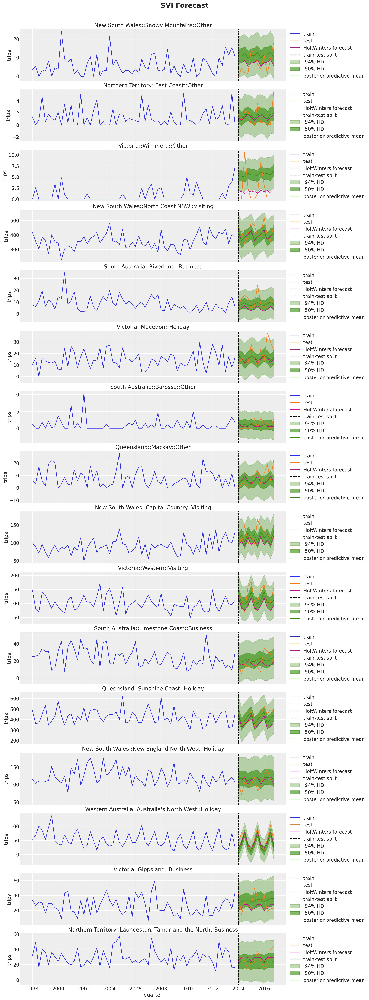

In [31]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 40),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )
    sns.lineplot(
        data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
        x="quarter",
        y="HoltWinters",
        color="C3",
        label="HoltWinters forecast",
        ax=ax,
    )
    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    for j, hdi in enumerate([0.94, 0.5]):
        az.plot_hdi(
            x=pivot_data_test_df["quarter"],
            y=svi_idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
            hdi_prob=hdi,
            smooth=False,
            color="C2",
            fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .0%} HDI"},
            ax=ax,
        )

    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=svi_idata.posterior_predictive["y_forecast"]
        .sel(unique_id=unique_id)
        .mean(dim=("chain", "draw")),
        color="C2",
        label="posterior predictive mean",
        ax=ax,
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("SVI Forecast", fontsize=20, fontweight="bold", y=1.02);

The results also look reasonable! Nevertheless, even though the model is the same, we do get some differences. We can clearly see this in the example above:

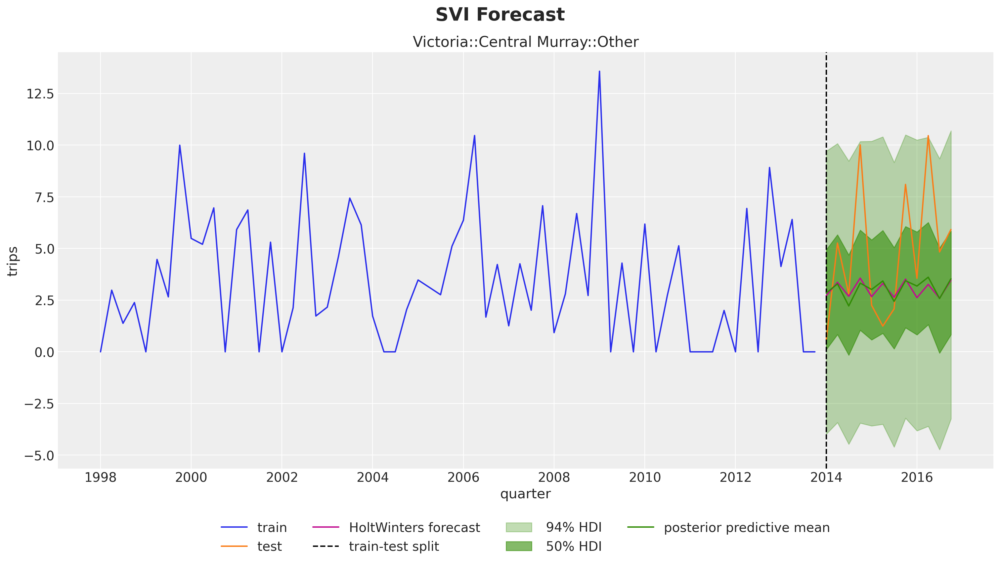

In [32]:
fig, ax = plt.subplots(figsize=(15, 8))


unique_id = "Victoria::Central Murray::Other"

sns.lineplot(
    x=pivot_data_train_df["quarter"],
    y=pivot_data_train_df[unique_id],
    color="C0",
    label="train",
    ax=ax,
)
sns.lineplot(
    x=pivot_data_test_df["quarter"],
    y=pivot_data_test_df[unique_id],
    color="C1",
    label="test",
    ax=ax,
)
sns.lineplot(
    data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
    x="quarter",
    y="HoltWinters",
    color="C3",
    label="HoltWinters forecast",
    ax=ax,
)
ax.axvline(
    train_test_split_date,
    color="black",
    linestyle="--",
    label="train-test split",
)

for j, hdi in enumerate([0.94, 0.5]):
    az.plot_hdi(
        x=pivot_data_test_df["quarter"],
        y=svi_idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
        hdi_prob=hdi,
        smooth=False,
        color="C2",
        fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .0%} HDI"},
        ax=ax,
    )

sns.lineplot(
    x=pivot_data_test_df["quarter"],
    y=svi_idata.posterior_predictive["y_forecast"]
    .sel(unique_id=unique_id)
    .mean(dim=("chain", "draw")),
    color="C2",
    label="posterior predictive mean",
    ax=ax,
)

ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(title=unique_id, ylabel="trips")

fig.suptitle("SVI Forecast", fontsize=20, fontweight="bold", y=1.05);

The inferred trend component is milder in the SVI case for this specific time series.

## Evaluation

In this final section, we perform a model comparison based on this simple train-test split. We use the [CRPS metric](https://towardsdatascience.com/crps-a-scoring-function-for-bayesian-machine-learning-models-dd55a7a337a8) to compare the models.

>"The CRPS — Continuous Ranked Probability Score — is a score function that compares a single ground truth value to a cumulative distribution function. It can be used as a metric to evaluate a model’s performance when the target variable is continuous and the model predicts the target’s distribution; examples include Bayesian regression or Bayesian time series models."

We borrow an implementation of the CRPS metric from [`pyro.ops.stats.crps_empirical`](https://docs.pyro.ai/en/dev/_modules/pyro/ops/stats.html) and simply translate it to JAX.

In [33]:
def crps(truth, pred, sample_weight=None):
    if pred.shape[1:] != (1,) * (pred.ndim - truth.ndim - 1) + truth.shape:
        raise ValueError(
            f"""Expected pred to have one extra sample dim on left.
            Actual shapes: {pred.shape} versus {truth.shape}"""
        )

    absolute_error = jnp.mean(jnp.abs(pred - truth), axis=0)

    num_samples = pred.shape[0]
    if num_samples == 1:
        return np.average(absolute_error, weights=sample_weight)

    pred = jnp.sort(pred, axis=0)
    diff = pred[1:] - pred[:-1]
    weight = jnp.arange(1, num_samples) * jnp.arange(num_samples - 1, 0, -1)
    weight = weight.reshape(weight.shape + (1,) * (diff.ndim - 1))

    per_obs_crps = absolute_error - jnp.sum(diff * weight, axis=0) / num_samples**2
    return jnp.average(per_obs_crps, weights=sample_weight)

Let's compute the CRPS for the NUTS and SVI models.

In [34]:
y_pred_nuts = jnp.array(
    az.extract(
        data=idata, group="posterior_predictive", var_names=["y_forecast"]
    ).transpose("sample", ...)
)

y_pred_svi = jnp.array(
    az.extract(
        data=svi_idata, group="posterior_predictive", var_names=["y_forecast"]
    ).transpose("sample", ...)
)

In [35]:
crps(truth=y_test, pred=y_pred_nuts)

Array(11.4582815, dtype=float32)

In [36]:
crps(truth=y_test, pred=y_pred_svi)

Array(11.302123, dtype=float32)

The results are very similar!

One important aspect of the CRPS metric is that it reduces to the Mean Absolute Error (MAE) for point forecasts. Let's do this for all of the models.

In [37]:
y_pred_autoets = (
    sf_forecast.pivot(index="quarter", columns="unique_id", values="AutoETS")
    .select(train_unique_ids)
    .to_jax()[None, ...]
)

y_pred_hw = (
    sf_forecast.pivot(index="quarter", columns="unique_id", values="HoltWinters")
    .select(train_unique_ids)
    .to_jax()[None, ...]
)

y_pred_seasonal = (
    sf_forecast.pivot(index="quarter", columns="unique_id", values="SeasonalNaive")
    .select(train_unique_ids)
    .to_jax()[None, ...]
)

y_pred_nuts_mean = jnp.array(
    idata.posterior_predictive["y_forecast"].mean(dim=("chain", "draw"))
)[None, ...]

y_pred_svi_mean = jnp.array(
    svi_idata.posterior_predictive["y_forecast"].mean(dim=("chain", "draw"))
)[None, ...]

/var/folders/cm/3dzy9rdd5s3672z0s1brjkvh0000gn/T/ipykernel_20519/2476404157.py:2: DeprecationWarning: the argument `columns` for `DataFrame.pivot` is deprecated. It was renamed to `on` in version 1.0.0.
  sf_forecast.pivot(index="quarter", columns="unique_id", values="AutoETS")
/var/folders/cm/3dzy9rdd5s3672z0s1brjkvh0000gn/T/ipykernel_20519/2476404157.py:8: DeprecationWarning: the argument `columns` for `DataFrame.pivot` is deprecated. It was renamed to `on` in version 1.0.0.
  sf_forecast.pivot(index="quarter", columns="unique_id", values="HoltWinters")
/var/folders/cm/3dzy9rdd5s3672z0s1brjkvh0000gn/T/ipykernel_20519/2476404157.py:14: DeprecationWarning: the argument `columns` for `DataFrame.pivot` is deprecated. It was renamed to `on` in version 1.0.0.
  sf_forecast.pivot(index="quarter", columns="unique_id", values="SeasonalNaive")


In [38]:
crps_df = pl.DataFrame(
    {
        "AutoETS": crps(truth=y_test, pred=y_pred_autoets).mean(),
        "HoltWinters": crps(truth=y_test, pred=y_pred_hw).mean(),
        "SeasonalNaive": crps(truth=y_test, pred=y_pred_seasonal).mean(),
        "NUTS-Mean": crps(truth=y_test, pred=y_pred_nuts_mean).mean(),
        "SVI-Mean": crps(truth=y_test, pred=y_pred_svi_mean).mean(),
        "NUTS": crps(truth=y_test, pred=y_pred_nuts).mean(),
        "SVI": crps(truth=y_test, pred=y_pred_svi).mean(),
    }
)

melt_crps_df = (
    crps_df.melt(value_vars=crps_df.columns, variable_name="model", value_name="crps")
    .with_columns(
        point_estimate=pl.when(pl.col("model") == pl.lit("NUTS"))
        .then(0)
        .when(pl.col("model") == pl.lit("SVI"))
        .then(0)
        .otherwise(1)
    )
    .sort("model")
)

/var/folders/cm/3dzy9rdd5s3672z0s1brjkvh0000gn/T/ipykernel_20519/1239218198.py:14: DeprecationWarning: `DataFrame.melt` is deprecated; use `DataFrame.unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`
  crps_df.melt(value_vars=crps_df.columns, variable_name="model", value_name="crps")


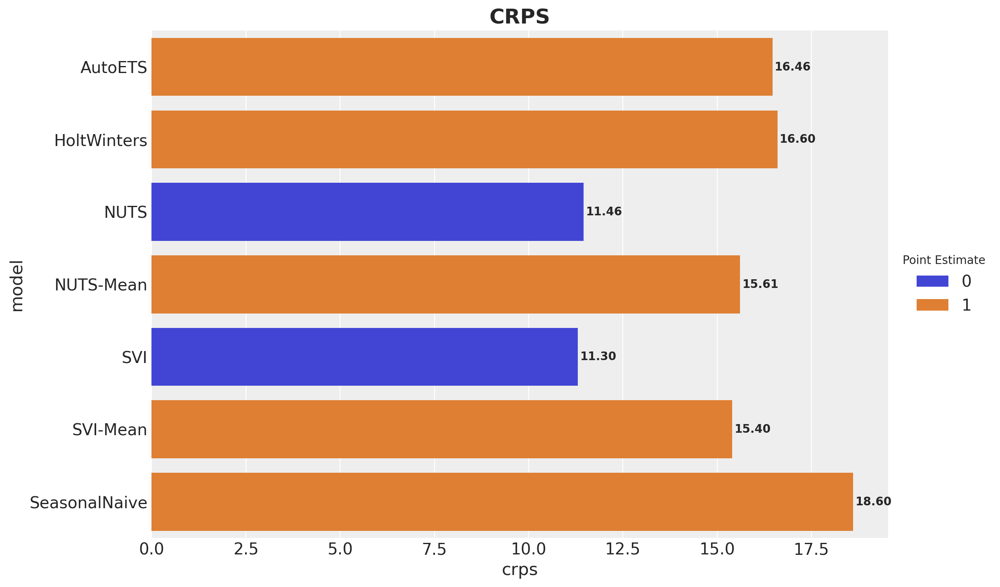

In [39]:
fig, ax = plt.subplots()

sns.barplot(
    data=melt_crps_df,
    x="crps",
    y="model",
    hue="point_estimate",
    ax=ax,
)


for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%.2f",
        label_type="edge",
        padding=2,
        fontsize=10,
        fontweight="bold",
    )

ax.legend(title="Point Estimate", loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title("CRPS", fontsize=18, fontweight="bold");

Here are some takeaways from this plot:

- For point forecasts, the SVI model is the best by a small margin. To make a better performance comparison, we should use a time series cross-validation strategy (homework for the reader 🤓).
- The NUTS and SVI models' performance is very similar. In real large-scale applications, SVI is a great alternative to NUTS (one still has to do prior sensitivity analysis; there is no free lunch!).
- Statistical univariate models are hard to beat! AutoETS is the best statistical model in this case.